In [5]:
from pathlib import Path
import pandas as pd
import autosklearn.regression
import sklearn
import matplotlib.pyplot as plt
import joblib
import math
import time
from IPython.display import display
from nextorch import plotting, bo, doe, io

In [6]:
# Train the flow reaction model for yield prediction from scratch
DATA_PATH = Path("../data/yield")
TRAIN = DATA_PATH / "train.csv"
TEST = DATA_PATH / "test.csv"
dataset_name = "flow"


def load_data(path: Path) -> tuple:
    df = pd.read_csv(path)
    X = df.drop("target", axis=1).to_numpy()
    y = df["target"].to_numpy()
    return df, X, y


df_train, X_train, y_train = load_data(TRAIN)
df_test, X_test, y_test = load_data(TEST)

In [7]:
# Inspect the input data
df = pd.concat([df_train, df_test])
print(len(df))
df.head()

30


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,target
0,2.66,8.45,-39.0,3.15,121.20,-30,54.65
1,2.65,4.23,-39.0,3.15,121.20,-30,74.50
2,2.66,2.07,-39.0,3.15,121.20,-30,72.93
3,3.13,3.70,-39.0,3.15,121.20,-30,71.73
4,2.07,9.14,-34.0,0.71,8.64,-35,24.49


In [8]:
# Set the operating range for each parameter
X_ranges = []
# Set the reponse range
Y_plot_range = []

for column in df.columns:
    num = len(df)
    max_value = df[column].max()
    min_value = df[column].min()
    data_range = max_value - min_value
    print(f"ColName: {column}")
    print(f"Max value: {max_value}, Recommendation: {math.ceil(max_value)}")
    print(f"Min value: {min_value}, Recommendation: {math.floor(min_value)}")
    print(f"Range: {data_range}, Recommendation: {data_range / num}")
    print("------------------------")
    # Excludes traget
    if column == "target":
        Y_plot_range.extend([0, 100])
    else:
        X_ranges.append([min_value, max_value])

ColName: m_B
Max value: 3.13, Recommendation: 4
Min value: 2.07, Recommendation: 2
Range: 1.06, Recommendation: 0.035333333333333335
------------------------
ColName: t_RT1
Max value: 36.57, Recommendation: 37
Min value: 2.07, Recommendation: 2
Range: 34.5, Recommendation: 1.15
------------------------
ColName: T_drawH
Max value: -17.3, Recommendation: -17
Min value: -49.0, Recommendation: -49
Range: 31.7, Recommendation: 1.0566666666666666
------------------------
ColName: m_C
Max value: 3.15, Recommendation: 4
Min value: 0.71, Recommendation: 0
Range: 2.44, Recommendation: 0.08133333333333333
------------------------
ColName: t_RT2
Max value: 278.6, Recommendation: 279
Min value: 3.85, Recommendation: 3
Range: 274.75, Recommendation: 9.158333333333333
------------------------
ColName: T_methyl
Max value: -12, Recommendation: -12
Min value: -41, Recommendation: -41
Range: 29, Recommendation: 0.9666666666666667
------------------------
ColName: target
Max value: 87.69, Recommendation: 

In [10]:
# Auto-sklearn model
model_path = Path("../model/autosklearn/")
model_path.mkdir(exist_ok=True, parents=True)

rerun = True

if rerun:
    automl = autosklearn.regression.AutoSklearnRegressor(
        time_left_for_this_task=120,
        per_run_time_limit=30,
    )
    automl.fit(X_train, y_train, dataset_name=dataset_name)
    joblib.dump(automl, model_path / "auto-sklearn_reg_single.pkl")
else:
    automl = joblib.load(model_path / "auto-sklearn_reg_single.pkl")
    print(automl.predict(X_train))  # Print some prediction for X_train

Fitting to the training data:   3%|▎         | 4/120 [00:04<01:56,  1.00s/it, The total time budget for this task is 0:02:00]

Fitting to the training data: 100%|██████████| 120/120 [01:48<00:00,  1.10it/s, The total time budget for this task is 0:02:00]


          rank  ensemble_weight              type      cost  duration
model_id                                                             
46           1             0.46  gaussian_process  0.194737  0.561561
41           2             0.16  gaussian_process  0.280309  0.542443
11           3             0.30    ard_regression  0.320819  0.828239
40           4             0.08               mlp  0.604367  0.520756
Train R2 score: 0.92424587979555
Test R2 score: 0.9859614811624412


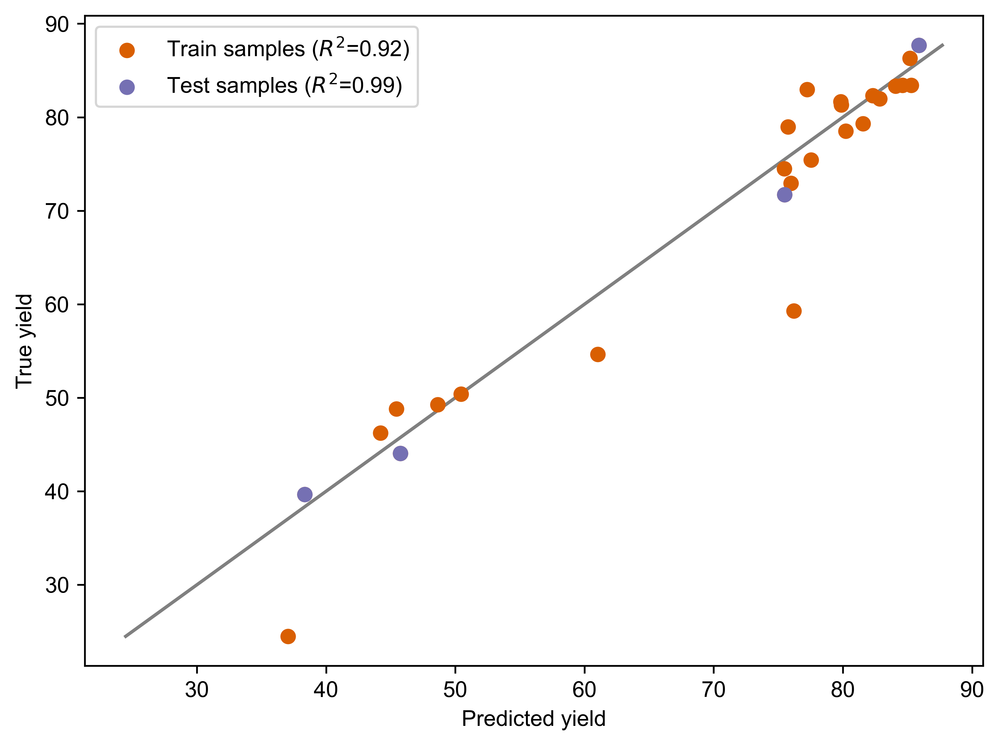

In [20]:
# Assuming `automl` has been properly defined and fitted, and X_train, y_train, X_test, y_test are defined
print(automl.leaderboard())

# Get the R2 score of the final ensemble for both train and test sets
train_predictions = automl.predict(X_train)
train_r2 = sklearn.metrics.r2_score(y_train, train_predictions)
print("Train R2 score:", train_r2)

test_predictions = automl.predict(X_test)
test_r2 = sklearn.metrics.r2_score(y_test, test_predictions)
print("Test R2 score:", test_r2)

# Plotting
plt.rcParams["font.family"] = "arial"
plt.rcParams['figure.dpi'] = 600

plt.scatter(train_predictions, y_train, label="Train samples ($R^2$=0.92)", c="#d95f02")
plt.scatter(test_predictions, y_test, label="Test samples ($R^2$=0.99)", c="#7570b3")
plt.xlabel("Predicted yield")
plt.ylabel("True yield")
plt.legend()

# Add a diagonal line to represent the perfect R2 score
plt.plot([min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         [min(y_train.min(), y_test.min()), max(y_train.max(), y_test.max())], 
         c="grey", zorder=0)

plt.tight_layout()
plt.show()

In [14]:
def Reactor(X_real):
    Y_real = automl.predict(X_real)
    return Y_real.reshape(-1, 1)  # yield

In [15]:
# Objective function
objective_func = Reactor

# Define the design space
x_name_simple = df.columns[:-1]
X_name_list = x_name_simple
X_units = ["" for i in range(len(x_name_simple))]

# Add the units
X_name_with_unit = []
for i, var in enumerate(X_name_list):
    if not X_units[i] == "":
        var = var + " (" + X_units[i] + ")"
    X_name_with_unit.append(var)

# One output
Y_name_with_unit = "Yield"

# combine X and Y names
var_names = X_name_with_unit + [Y_name_with_unit]

# Get the information of the design space
n_dim = len(X_name_list)  # the dimension of inputs
n_objective = 1  # the dimension of outputs

In [16]:
# Initial Sampling
# Full factorial design
n_dim = 6
n_ff_level = 3
# n_total = n_ff_level**n_dim
n_total = n_ff_level**n_dim

X_ff = doe.full_factorial([n_ff_level for i in range(n_dim)])
# Get the initial responses
Y_ff = bo.eval_objective_func(X_ff, X_ranges, objective_func)

In [17]:
# Latin hypercube design with 10 initial points
n_init_lhc = 10
X_init_lhc = doe.latin_hypercube(n_dim=n_dim, n_points=n_init_lhc, seed=2)
# Get the initial responses
Y_init_lhc = bo.eval_objective_func(X_init_lhc, X_ranges, objective_func)

In [18]:
# Completely random design
X_rnd = doe.randomized_design(n_dim=n_dim, n_points=n_total, seed=1)
# Get the responses
Y_rnd = bo.eval_objective_func(X_rnd, X_ranges, objective_func)

In [25]:
# Slight modification on names
X_name_with_unit = ["Eq-B", "$t_{res}$-1", "Temp-1", "Eq-C", "$t_{res}$-2", "Temp-2"]

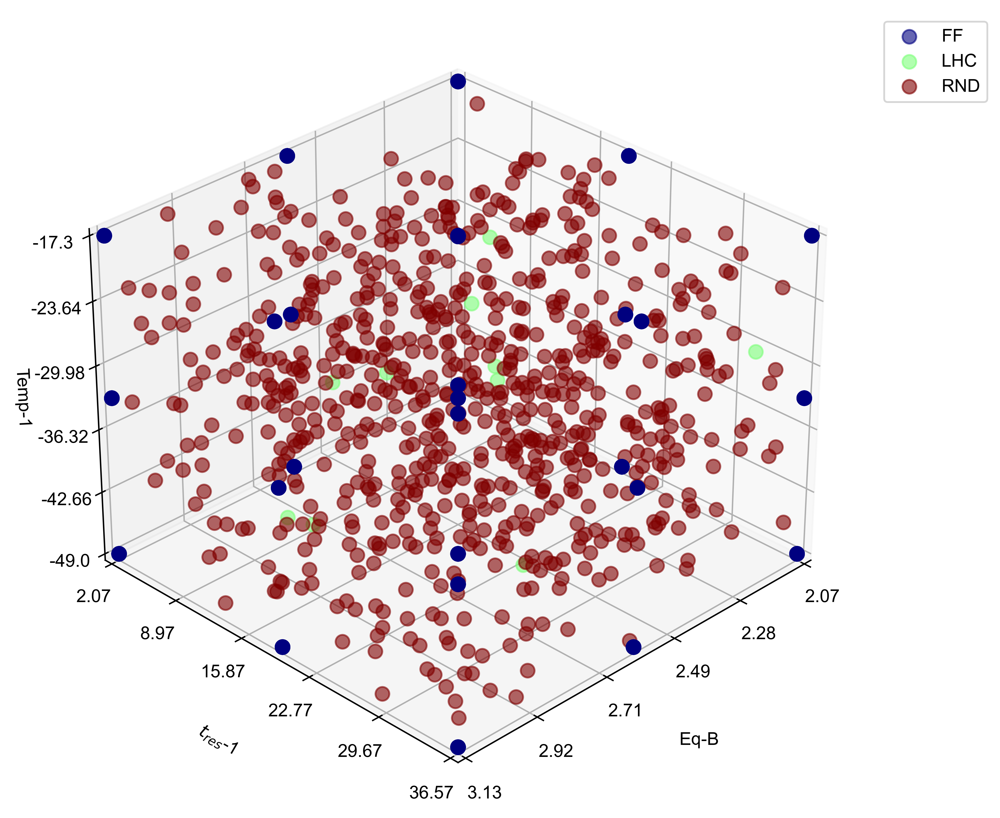

In [26]:
# Compare the 3 sampling plans

plotting.sampling_3d(
    [X_ff, X_init_lhc, X_rnd],
    X_names=X_name_with_unit,
    X_ranges=X_ranges,
    design_names=["FF", "LHC", "RND"],
)

In [27]:
# %% Initialize an Experiment object
# Set its name, the files will be saved under the folder with the same name
Exp_ff = bo.Experiment("yield_ff")
# Import the initial data
Exp_ff.input_data(X_ff, Y_ff, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_ff.set_optim_specs(objective_func=objective_func, maximize=True)

/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/gpytorch/lazy/triangular_lazy_tensor.py:136: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at /opt/conda/conda-bld/pytorch_1670525541035/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:2115.)
  res = torch.triangular_solve(right_tensor, self.evaluate(), upper=self.upper).solution


Iter 10/100: 1.2681047916412354
Iter 20/100: 1.0721744298934937
Iter 30/100: 0.6987490057945251


In [28]:
# Set its name, the files will be saved under the folder with the same name
Exp_lhc = bo.Experiment("yield_lhc")
# Import the initial data
Exp_lhc.input_data(X_init_lhc, Y_init_lhc, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_lhc.set_optim_specs(objective_func=objective_func, maximize=True)

Iter 10/100: 2.1118476390838623
Iter 20/100: 1.9467971324920654
Iter 30/100: 1.8954576253890991
Iter 40/100: 1.8635644912719727
Iter 50/100: 1.856170892715454
Iter 60/100: 1.8523881435394287


In [29]:
# Set its name, the files will be saved under the folder with the same name
Exp_rnd = bo.Experiment("yield_rnd")
# Import the initial data
Exp_rnd.input_data(X_rnd, Y_rnd, X_ranges=X_ranges, unit_flag=True)
# Set the optimization specifications
# here we set the objective function, minimization by default
Exp_rnd.set_optim_specs(objective_func=objective_func, maximize=True)

Iter 10/100: 1.251504898071289
Iter 20/100: 1.0654295682907104
Iter 30/100: 0.7132411599159241
Iter 40/100: 0.10979154706001282


In [30]:
# Optimization loop
# Set the number of iterations
n_trials_lhc = n_total - n_init_lhc
print(f"Num of trials of lhc: {n_trials_lhc}")
for i in range(n_trials_lhc):
    # Generate the next experiment point
    X_new, X_new_real, acq_func = Exp_lhc.generate_next_point()
    # Get the reponse at this point
    Y_new_real = objective_func(X_new_real)
    # or
    # Y_new_real = bo.eval_objective_func(X_new, X_ranges, objective_func)

    # Retrain the model by input the next point into Exp object
    Exp_lhc.run_trial(X_new, X_new_real, Y_new_real)

Num of trials of lhc: 719
Iter 10/100: 1.7614535093307495
Iter 20/100: 1.7563068866729736
Iter 10/100: 1.6561006307601929


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 1.6059218645095825
Iter 10/100: 1.5131714344024658
Iter 10/100: 1.4571053981781006
Iter 10/100: 1.404088020324707
Iter 10/100: 1.3542355298995972


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 1.3328405618667603
Iter 10/100: 1.287520408630371
Iter 10/100: 1.2360961437225342
Iter 10/100: 1.1903676986694336


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 1.1452893018722534
Iter 10/100: 1.088071584701538
Iter 10/100: 1.056900978088379
Iter 10/100: 1.0141223669052124
Iter 10/100: 0.9069424867630005
Iter 10/100: 1.025476098060608
Iter 10/100: 0.8703208565711975
Iter 10/100: 0.4393922686576843
Iter 20/100: 0.4372783601284027
Iter 30/100: 0.43480512499809265
Iter 40/100: 0.4345325231552124
Iter 50/100: 0.43436866998672485
Iter 10/100: 0.8610003590583801
Iter 10/100: 0.5020111203193665


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.28024470806121826
Iter 10/100: 0.24047741293907166
Iter 10/100: 0.21647316217422485
Iter 20/100: 0.2158603072166443
Iter 30/100: 0.21527130901813507
Iter 10/100: 0.18104387819766998
Iter 20/100: 0.18100598454475403
Iter 10/100: 0.16289056837558746
Iter 10/100: 0.12903684377670288
Iter 10/100: 0.6287379264831543
Iter 10/100: 0.08445821702480316
Iter 10/100: 0.735420286655426
Iter 10/100: 0.3854055106639862
Iter 10/100: 0.5675510764122009
Iter 10/100: 0.23356179893016815


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.5270650386810303
Iter 10/100: 0.4089931547641754
Iter 10/100: 0.7167109847068787
Iter 10/100: 0.4204992651939392
Iter 10/100: 0.6204497218132019
Iter 10/100: 0.012860151939094067
Iter 20/100: 0.005478518549352884
Iter 30/100: 0.0015677432529628277
Iter 10/100: -0.012808408588171005
Iter 20/100: -0.013406038284301758
Iter 30/100: -0.013501343317329884
Iter 10/100: -0.04499896988272667
Iter 20/100: -0.045428164303302765
Iter 30/100: -0.045512884855270386
Iter 40/100: -0.04552556201815605
Iter 10/100: -0.029039442539215088
Iter 20/100: -0.029563643038272858
Iter 30/100: -0.029564587399363518
Iter 10/100: -0.0143513772636652
Iter 20/100: -0.014938381500542164
Iter 30/100: -0.01505087036639452
Iter 40/100: -0.015065467916429043
Iter 10/100: -0.000922631355933845
Iter 10/100: 0.006180550903081894
Iter 20/100: 0.006187031511217356
Iter 10/100: 0.014164869673550129
Iter 20/100: 0.013835630379617214
Iter 30/100: 0.013724110089242458
Iter 10/100: -0.019388336688280106
Iter 20/100:

/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.5954097509384155
Iter 10/100: 0.5916072130203247
Iter 10/100: 0.5866713523864746
Iter 10/100: 0.5866171717643738
Iter 10/100: 0.5777416229248047
Iter 10/100: 0.5719173550605774
Iter 10/100: 0.5625208616256714


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.5583131313323975
Iter 10/100: 0.5518100261688232
Iter 10/100: 0.5457361340522766
Iter 10/100: 0.5404085516929626
Iter 10/100: 0.5347545146942139
Iter 10/100: 0.5328388810157776
Iter 10/100: 0.5268710255622864
Iter 10/100: 0.5228542685508728
Iter 10/100: 0.5172175765037537
Iter 10/100: 0.5166341066360474


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.513309121131897


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.5062561631202698
Iter 10/100: 0.5018810033798218
Iter 10/100: 0.49617236852645874
Iter 10/100: 0.4898824393749237
Iter 10/100: 0.4840020537376404
Iter 10/100: 0.4789298176765442
Iter 10/100: 0.47357380390167236
Iter 10/100: 0.4669404923915863
Iter 10/100: 0.4662565588951111
Iter 10/100: 0.4617444574832916
Iter 10/100: 0.45649147033691406
Iter 10/100: 0.4504677653312683
Iter 10/100: 0.44531410932540894
Iter 10/100: 0.4454095661640167
Iter 10/100: 0.4433639347553253
Iter 10/100: 0.44197800755500793
Iter 10/100: 0.44496291875839233
Iter 10/100: 0.44247013330459595
Iter 10/100: 0.4417686462402344
Iter 10/100: 0.43994230031967163
Iter 10/100: 0.43654894828796387
Iter 10/100: 0.4314715564250946
Iter 10/100: 0.4287228286266327
Iter 10/100: 0.4242427945137024
Iter 10/100: 0.42390134930610657
Iter 10/100: 0.4191438853740692
Iter 10/100: 0.4147336184978485
Iter 10/100: 0.41430792212486267
Iter 10/100: 0.4100642204284668
Iter 10/100: 0.40575507283210754
Iter 10/100: 0.4042484164237

/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.30054882168769836
Iter 10/100: 0.31280526518821716
Iter 10/100: 0.31143707036972046
Iter 10/100: 0.3192390203475952
Iter 10/100: 0.31634753942489624
Iter 10/100: 0.32286375761032104
Iter 10/100: 0.3192749619483948
Iter 10/100: 0.32610300183296204
Iter 10/100: 0.32234615087509155
Iter 10/100: 0.3274177014827728
Iter 10/100: 0.32314005494117737
Iter 10/100: 0.33517658710479736
Iter 10/100: 0.32995858788490295
Iter 10/100: 0.33400702476501465
Iter 10/100: 0.33014410734176636
Iter 10/100: 0.3317004144191742
Iter 10/100: 0.3258609175682068
Iter 10/100: 0.32788926362991333
Iter 10/100: 0.32825610041618347
Iter 10/100: 0.33020445704460144
Iter 10/100: 0.3272940218448639
Iter 10/100: 0.3307889699935913
Iter 10/100: 0.3288803994655609


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.33187416195869446
Iter 10/100: 0.3276297450065613
Iter 10/100: 0.3289910852909088
Iter 10/100: 0.32361674308776855
Iter 10/100: 0.32602277398109436
Iter 10/100: 0.3209105432033539
Iter 10/100: 0.32197892665863037
Iter 10/100: 0.31674104928970337
Iter 10/100: 0.3191860616207123
Iter 10/100: 0.3135760426521301
Iter 10/100: 0.3168983459472656
Iter 10/100: 0.3111417293548584


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.3128354549407959
Iter 10/100: 0.3075263798236847
Iter 10/100: 0.31152886152267456
Iter 10/100: 0.3068469762802124
Iter 10/100: 0.30969375371932983
Iter 10/100: 0.30459749698638916
Iter 10/100: 0.30806365609169006
Iter 10/100: 0.30433881282806396
Iter 10/100: 0.30699336528778076
Iter 10/100: 0.3018433749675751
Iter 10/100: 0.303567498922348
Iter 10/100: 0.2988060414791107
Iter 10/100: 0.3016728162765503
Iter 10/100: 0.29656487703323364
Iter 10/100: 0.2989334464073181
Iter 10/100: 0.2946591079235077


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)
/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.2969108819961548
Iter 10/100: 0.29262587428092957
Iter 10/100: 0.2951413094997406
Iter 10/100: 0.2907581627368927
Iter 10/100: 0.29304012656211853


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.2900867164134979
Iter 10/100: 0.2941405773162842
Iter 10/100: 0.29066935181617737
Iter 10/100: 0.2918793261051178
Iter 10/100: 0.28801479935646057
Iter 10/100: 0.28885945677757263
Iter 10/100: 0.2858281135559082
Iter 10/100: 0.2873610556125641
Iter 10/100: 0.28402185440063477
Iter 10/100: 0.28432658314704895
Iter 10/100: 0.2814774513244629
Iter 10/100: 0.2818898558616638
Iter 10/100: 0.2814143896102905
Iter 10/100: 0.29071760177612305
Iter 10/100: 0.2876848876476288
Iter 10/100: 0.2881321907043457
Iter 10/100: 0.2847839295864105
Iter 10/100: 0.2878333330154419
Iter 10/100: 0.28586164116859436
Iter 10/100: 0.28673169016838074
Iter 10/100: 0.2832021117210388
Iter 10/100: 0.28420549631118774
Iter 10/100: 0.28140881657600403
Iter 10/100: 0.2833153009414673
Iter 10/100: 0.2790333032608032
Iter 10/100: 0.280462384223938
Iter 10/100: 0.2763690650463104
Iter 10/100: 0.27798816561698914
Iter 10/100: 0.27396684885025024
Iter 10/100: 0.27594229578971863
Iter 10/100: 0.2717984318733

/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.27090829610824585
Iter 10/100: 0.2698386609554291
Iter 10/100: 0.2723403871059418


/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.2677217721939087
Iter 10/100: 0.2699759900569916
Iter 10/100: 0.2657339870929718
Iter 10/100: 0.2692178189754486
Iter 10/100: 0.264261931180954
Iter 10/100: 0.26691529154777527
Iter 10/100: 0.26243188977241516
Iter 10/100: 0.2668166756629944
Iter 10/100: 0.2624680697917938
Iter 10/100: 0.26561102271080017
Iter 10/100: 0.26089048385620117
Iter 10/100: 0.2641715705394745
Iter 10/100: 0.2598198354244232
Iter 10/100: 0.2637665271759033
Iter 10/100: 0.25977209210395813
Iter 10/100: 0.2625424861907959
Iter 10/100: 0.2585212290287018
Iter 10/100: 0.26745977997779846
Iter 10/100: 0.26442596316337585
Iter 10/100: 0.26794636249542236
Iter 10/100: 0.26686912775039673
Iter 10/100: 0.2729787528514862
Iter 10/100: 0.27077797055244446
Iter 10/100: 0.2721247971057892
Iter 10/100: 0.2697731852531433
Iter 10/100: 0.269844651222229
Iter 10/100: 0.2676294445991516
Iter 10/100: 0.2690848112106323
Iter 10/100: 0.26772385835647583
Iter 10/100: 0.26888570189476013
Iter 10/100: 0.267907828092575

/home/sun/mambaforge/envs/flow/lib/python3.7/site-packages/botorch/optim/optimize.py:287: RuntimeWarning: Optimization failed in `gen_candidates_scipy` with the following warning(s):
[OptimizationWarning('Optimization failed within `scipy.optimize.minimize` with status 2.')]
Trying again with a new set of initial conditions.
  warnings.warn(first_warn_msg, RuntimeWarning)


Iter 10/100: 0.238066628575325
Iter 10/100: 0.23735687136650085
Iter 10/100: 0.2367546260356903
Iter 10/100: 0.23604071140289307
Iter 10/100: 0.23593495786190033
Iter 10/100: 0.2350671887397766
Iter 10/100: 0.23448815941810608
Iter 10/100: 0.2337654083967209
Iter 10/100: 0.2334391176700592
Iter 10/100: 0.2329522669315338
Iter 10/100: 0.23277264833450317
Iter 10/100: 0.23236630856990814
Iter 10/100: 0.23154756426811218
Iter 10/100: 0.2311810702085495
Iter 10/100: 0.23040178418159485
Iter 10/100: 0.23021899163722992
Iter 10/100: 0.22946661710739136
Iter 10/100: 0.22865693271160126
Iter 10/100: 0.2282206416130066
Iter 10/100: 0.22977891564369202
Iter 10/100: 0.22891978919506073
Iter 10/100: 0.22814194858074188
Iter 10/100: 0.22739629447460175
Iter 10/100: 0.227708101272583
Iter 10/100: 0.22733193635940552
Iter 10/100: 0.22653625905513763
Iter 10/100: 0.22613634169101715
Iter 10/100: 0.22534877061843872
Iter 10/100: 0.22643014788627625
Iter 10/100: 0.2258431613445282
Iter 10/100: 0.2254088

In [31]:
def describe_stats(df):
    stats = pd.DataFrame({
        'Mean': df.mean(),
        'Variance': df.var(),
        'Median': df.median(),
        'Max': df.max(),
        'Min': df.min()
    })
    return stats

print(describe_stats(df))

                  均值           方差     中位数     最大值    最小值
m_B         2.515333     0.090777    2.63    3.13   2.07
t_RT1      19.112667   214.682751    9.34   36.57   2.07
T_drawH   -32.746667    56.905333  -34.00  -17.30 -49.00
m_C         2.528000     0.227058    2.52    3.15   0.71
t_RT2     103.559333  5931.461082  121.20  278.60   3.85
T_methyl  -30.633333    47.619540  -33.00  -12.00 -41.00
target     67.523667   334.937679   74.96   87.69  24.49


LHC sampling points


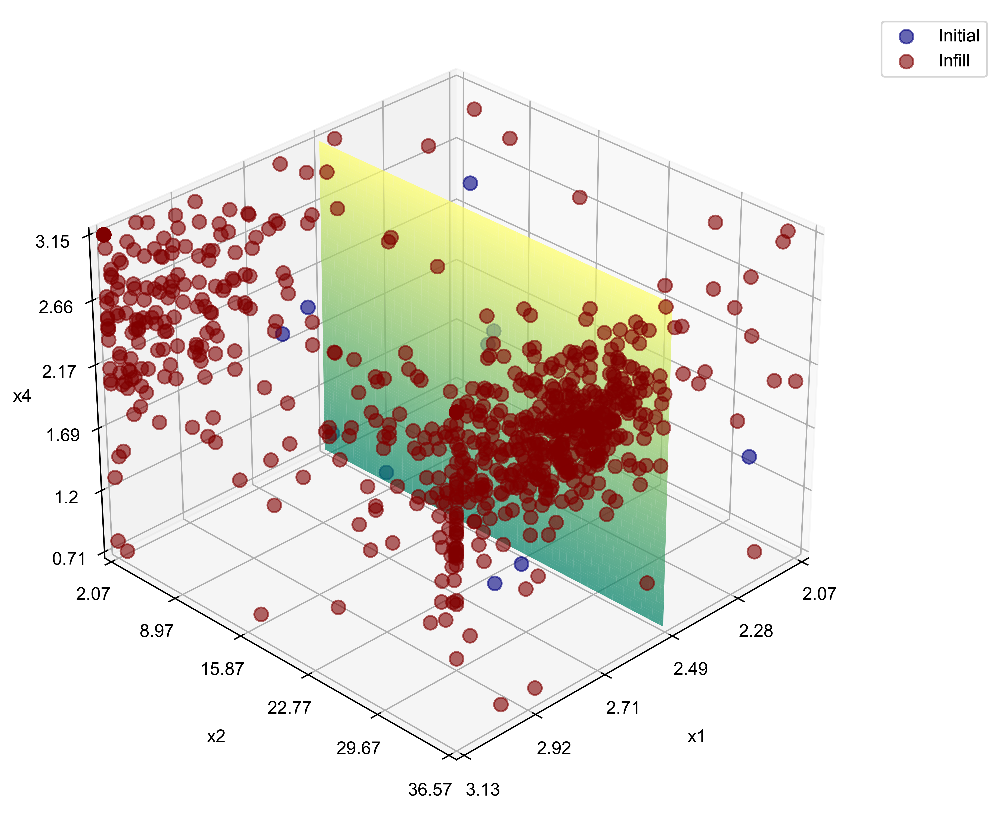

In [32]:
# Plots
# Check the sampling points
# Final lhc Sampling
x_indices = [0, 1, 3]  # three dimensional: x1, x2, and x4，这里选了三个维度，那么剩下的三个维度需要固定

print("LHC sampling points")
# 切割面可以在 x,y,z 轴，轴值对应的均值或者方差中寻找对应。
plotting.sampling_3d_exp(Exp_lhc, x_indices=x_indices, slice_axis="x", slice_value_real=2.5)

Objective function heatmap: 


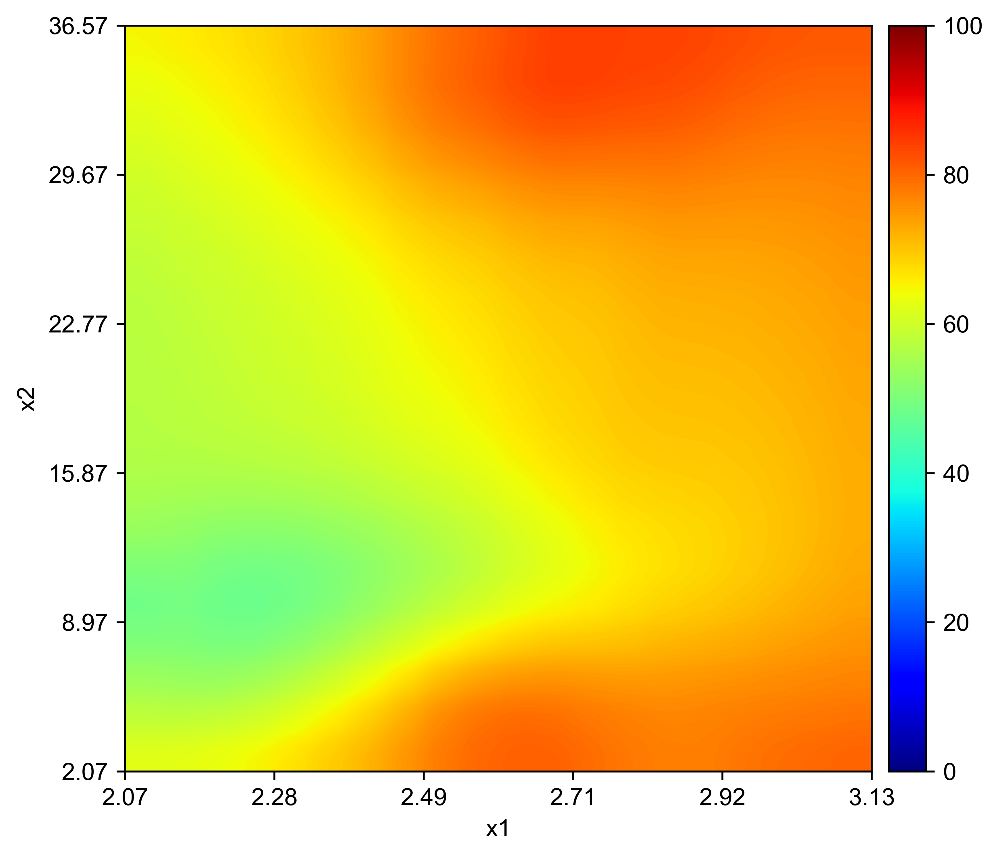

Evaluation of objective function 400 times takes 0.03 min



In [33]:
# Reponse heatmaps
# Set X_test mesh size
x_indices = [0, 1]  # 这里是 二维的重新选择两个维度
fixed_real = [-34, 2.5, 121, -33]

mesh_size = 20
n_test = mesh_size**2

# Objective function heatmap
# (this takes a long time)
print("Objective function heatmap: ")
start_time = time.time()

plotting.objective_heatmap(
    objective_func,
    X_ranges,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()

print(
    "Evaluation of objective function {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

Full factorial model heatmap: 


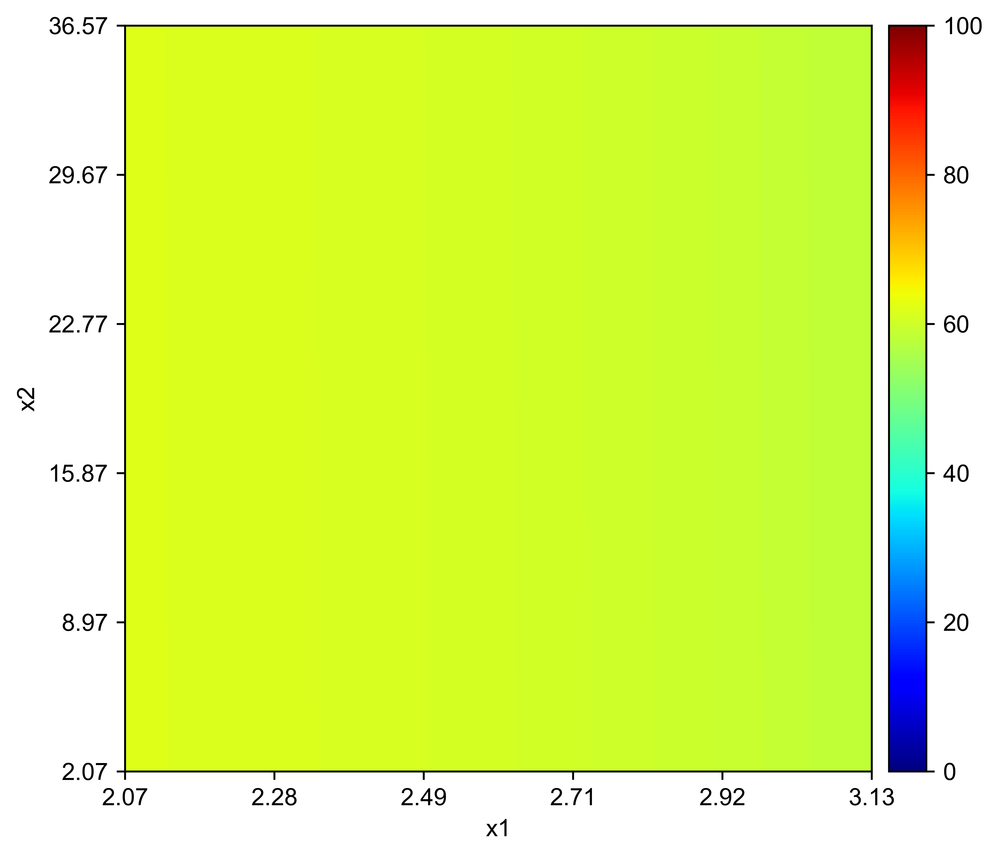

Evaluation of FF GP model 400 times takes 0.03 min

LHC model heatmap: 


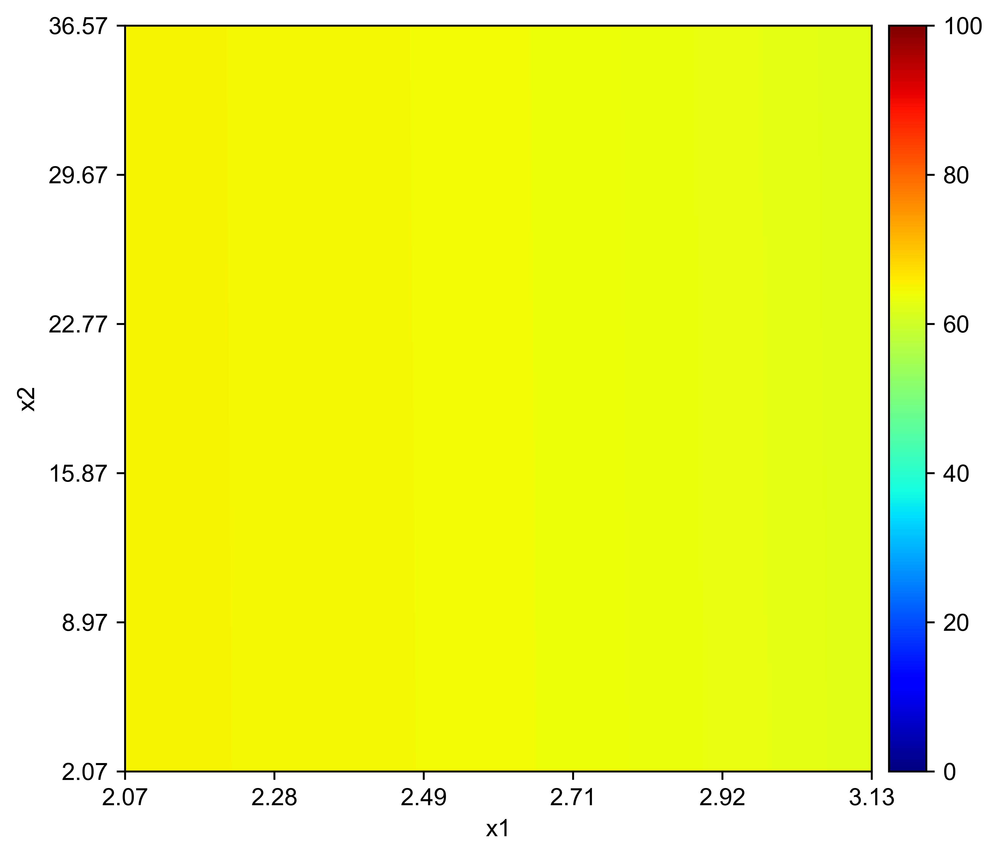

Evaluation of LHC GP model 400 times takes 0.03 min

RND model heatmap: 


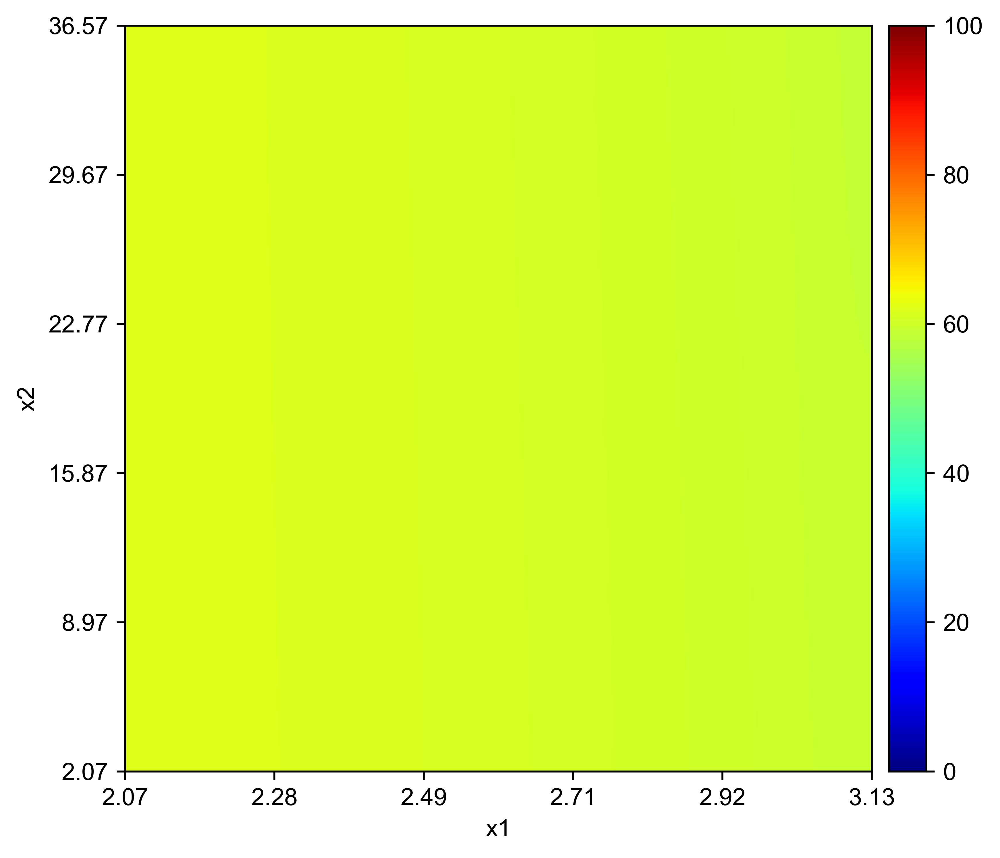

Evaluation of RND GP model 400 times takes 0.03 min



In [34]:
# full factorial heatmap
print("Full factorial model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_ff,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of FF GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# LHC heatmap
print("LHC model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_lhc,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of LHC GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# random sampling heatmap
print("RND model heatmap: ")
start_time = time.time()
plotting.response_heatmap_exp(
    Exp_rnd,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of RND GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

Objective function surface: 


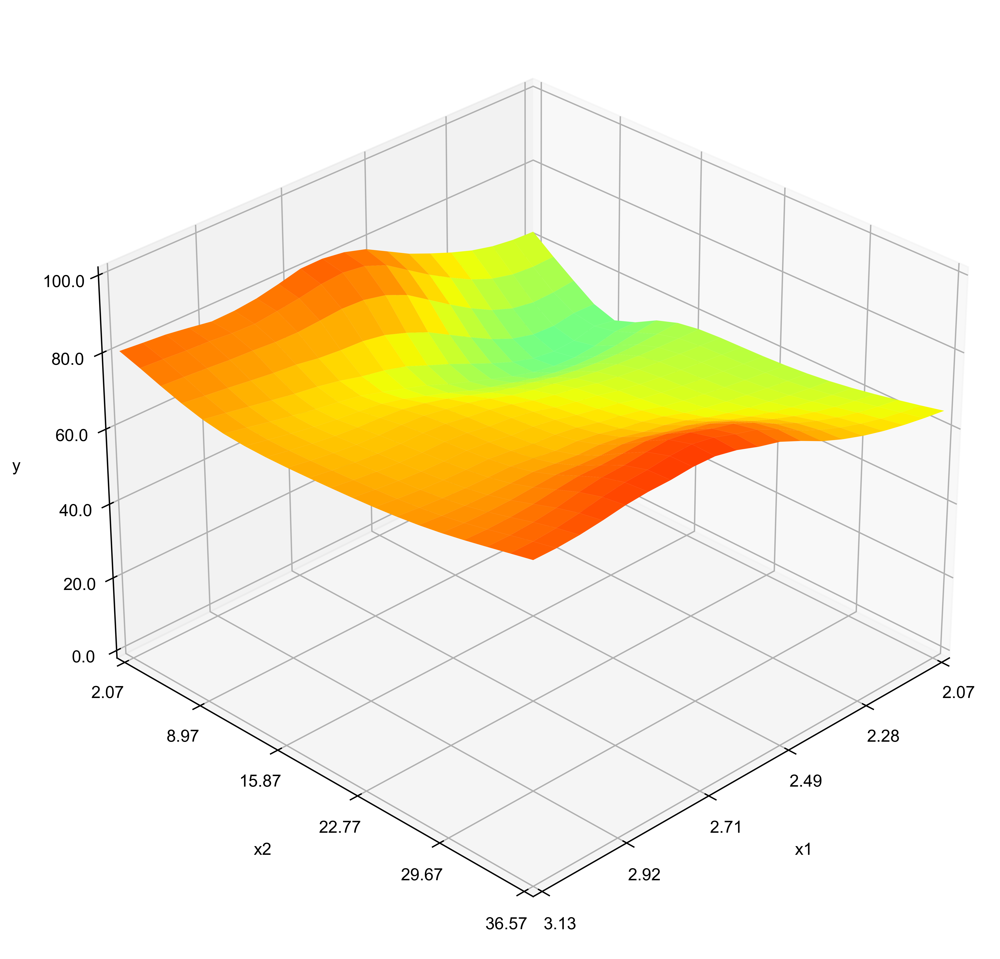

Evaluation of objective function 400 times takes 0.02 min

LHC model surface: 


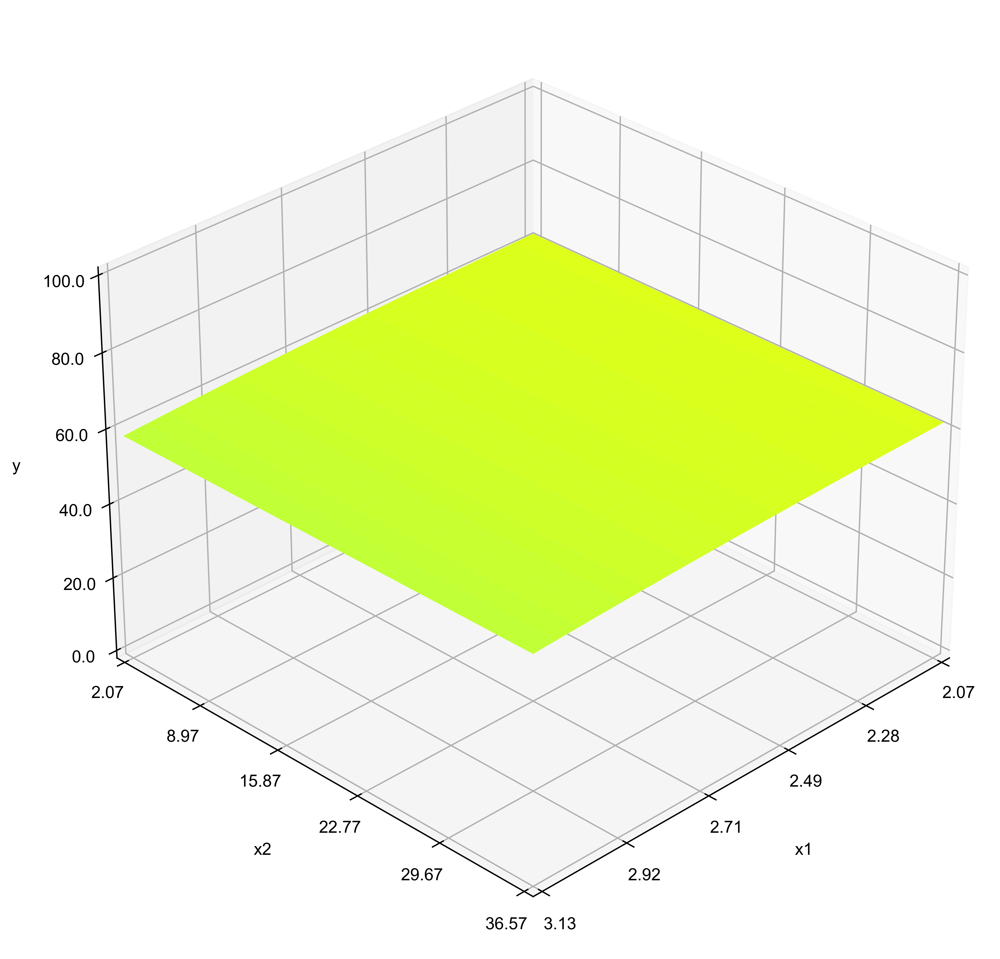

Evaluation of FF GP model 400 times takes 0.02 min

Full fatorial model surface: 


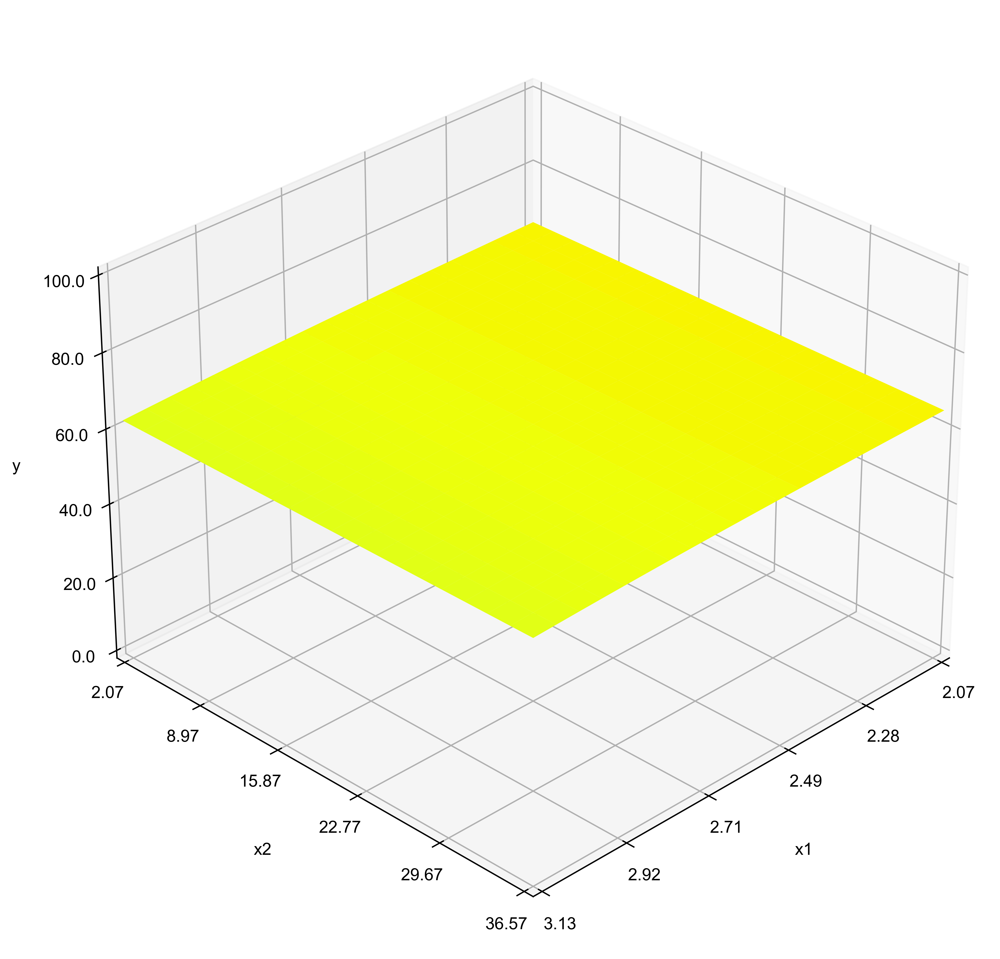

Evaluation of LHC GP model 400 times takes 0.02 min

RND model surface: 


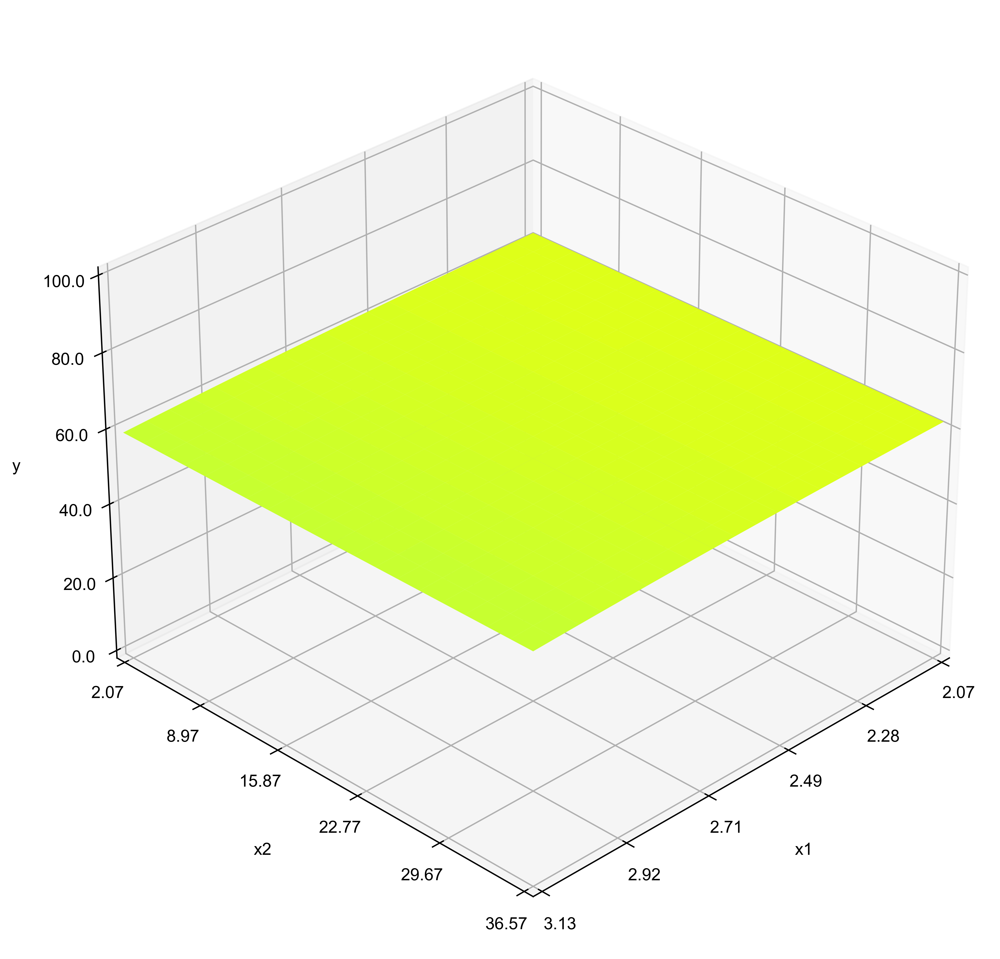

Evaluation of RND GP model 400 times takes 0.02 min



In [35]:
# Suface plots
# Objective function surface plot
# (this takes a long time)

print("Objective function surface: ")
start_time = time.time()
plotting.objective_surface(
    objective_func,
    X_ranges,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of objective function {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

# full fatorial surface plot
print("LHC model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_ff,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of FF GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)


# LHC surface plot
print("Full fatorial model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_lhc,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of LHC GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)


# random sampling surface plot
print("RND model surface: ")
start_time = time.time()
plotting.response_surface_exp(
    Exp_rnd,
    Y_real_range=Y_plot_range,
    x_indices=x_indices,
    fixed_values_real=fixed_real,
    mesh_size=mesh_size,
)
end_time = time.time()
print(
    "Evaluation of RND GP model {} times takes {:.2f} min\n".format(
        n_test, (end_time - start_time) / 60
    )
)

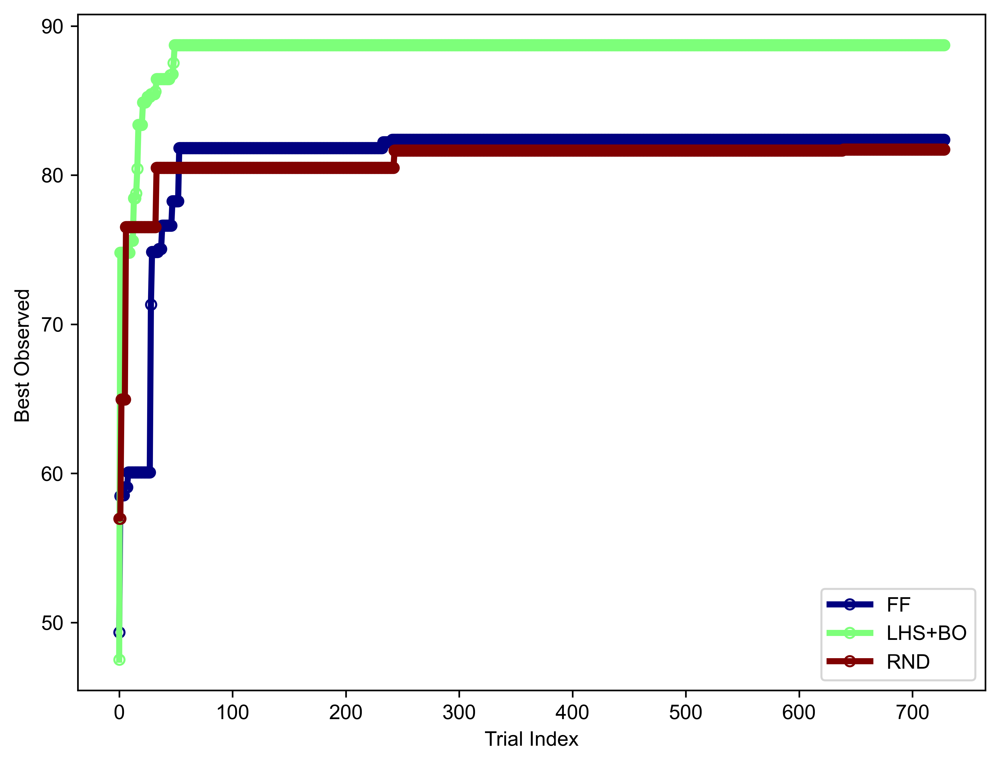

In [36]:
plotting.opt_per_trial(
    [Exp_ff.Y_real, Exp_lhc.Y_real, Exp_rnd.Y_real],
    design_names=["FF", "LHS+BO", "RND"],
)

Obtain the optimum from each method. 

In [23]:
# full factorial optimum
y_opt_ff, X_opt_ff, index_opt_ff = Exp_ff.get_optim()
data_opt_ff = io.np_to_dataframe([X_opt_ff, y_opt_ff], var_names)

print("From full factorial design, ")
display(data_opt_ff)

From full factorial design, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,2.6,36.57,-17.3,3.15,278.6,-41.0,82.379539


In [24]:
# lhc optimum
y_opt_lhc, X_opt_lhc, index_opt_lhc = Exp_lhc.get_optim()
data_opt_lhc = io.np_to_dataframe([X_opt_lhc, y_opt_lhc], var_names)

print("From LHS + Bayesian Optimization, ")
display(data_opt_lhc)

From LHS + Bayesian Optimization, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,2.714252,36.57,-25.019897,2.693482,278.600006,-35.166756,88.602077


In [25]:
# random sampling optimum
y_opt_rnd, X_opt_rnd, index_opt_rnd = Exp_rnd.get_optim()
data_opt_rnd = io.np_to_dataframe([X_opt_rnd, y_opt_rnd], var_names)

print("From random sampling, ")
display(data_opt_rnd)

From random sampling, 


,m_B,t_RT1,T_drawH,m_C,t_RT2,T_methyl,Yield
0,2.83851,32.942875,-26.451438,2.559843,246.565153,-30.358501,81.723427
